In [1]:
# Import dependencies
import pandas as pd
from sqlalchemy import create_engine
import matplotlib.pyplot as plt

In [2]:
# Create the SQLite engine
engine = create_engine('sqlite:///NAPLAN_SQLDB')

In [84]:
# Execute the SQL query and fetch data into a DataFrame
query = 'SELECT CALENDAR_YEAR, YEAR_LEVEL, DOMAIN, STATE, SUBGROUP, ENROLLED_STUDENTS, MEAN, MEAN_CI, MEAN_SD, NMS, NMS_CI, GAIN, GAIN_CI, EXEMPT, ABSENT, ASSESSED, WITHDRAWN, NONATTEMPT, PARTICIPATION_RATE, PARTICIPATION_NUMBER, NOT_STATED, AVERAGE_AGE, YEARS_OF_SCHOOLING, BANDCOL1, BANDCOL2, BANDCOL3, BANDCOL4, BANDCOL5, BANDCOL6, PCTL05, PCTL20, PCTL80, PCTL95, NOD_MEAN_PREV, NOD_NMS_PREV, NOD_MEAN_BASE, NOD_NMS_BASE FROM naplan_results_clean'
data1 = pd.read_sql_query(query, engine)
data1.head()

,CALENDAR_YEAR,YEAR_LEVEL,DOMAIN,STATE,SUBGROUP,ENROLLED_STUDENTS,MEAN,MEAN_CI,MEAN_SD,NMS,...,BANDCOL5,BANDCOL6,PCTL05,PCTL20,PCTL80,PCTL95,NOD_MEAN_PREV,NOD_NMS_PREV,NOD_MEAN_BASE,NOD_NMS_BASE
0,2008,3,Grammar and Punctuation,ACT,Parental Education: Bachelor,167,445.2,NaN,79.7,95.8,...,23.4,37.0,308.7,381.3,513.0,565.4,None,None,None,None
1,2008,3,Grammar and Punctuation,ACT,Parental Education: Certificate,72,396.1,NaN,91.0,90.0,...,15.3,20.3,240.9,319.4,476.6,546.1,None,None,None,None
2,2008,3,Grammar and Punctuation,ACT,Parental Education: Diploma,52,401.4,NaN,69.1,96.9,...,24.2,12.3,283.7,342.1,456.3,519.2,None,None,None,None
3,2008,3,Grammar and Punctuation,ACT,Parental Education: Not stated,4009,419.8,NaN,82.7,93.7,...,23.5,23.9,278.0,351.0,489.8,551.1,None,None,None,None
4,2008,3,Grammar and Punctuation,ACT,Non-LBOTE,3852,421.2,6.2,82.5,94.4,...,23.7,24.6,279.6,352.5,491.1,552.4,None,None,None,None


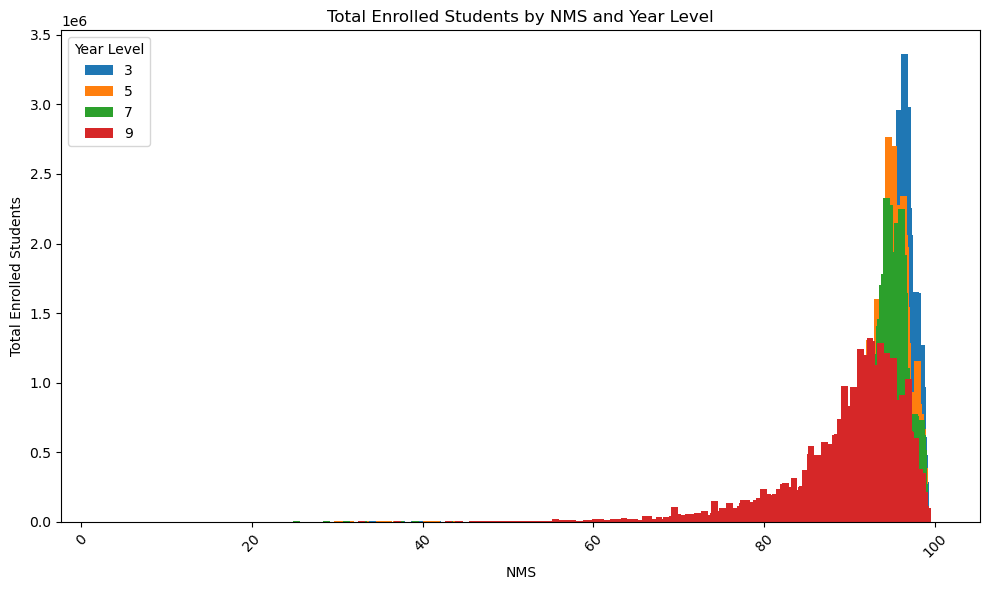

In [109]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you've fetched the data into the DataFrame 'data1'

# Group by Year Level and NMS to find total enrolled students for each NMS per year level
enrolled_by_nms = data1.groupby(['YEAR_LEVEL', 'NMS'])['ENROLLED_STUDENTS'].sum().reset_index()

# Plot a bar graph showing total enrolled students by NMS for each year level
plt.figure(figsize=(10, 6))
for year_level in enrolled_by_nms['YEAR_LEVEL'].unique():
    year_level_data = enrolled_by_nms[enrolled_by_nms['YEAR_LEVEL'] == year_level]
    plt.bar(year_level_data['NMS'], year_level_data['ENROLLED_STUDENTS'], label=str(year_level))

plt.title('Total Enrolled Students by NMS and Year Level')
plt.xlabel('NMS')
plt.ylabel('Total Enrolled Students')
plt.xticks(rotation=45)
plt.legend(title='Year Level')
plt.tight_layout()
plt.show()


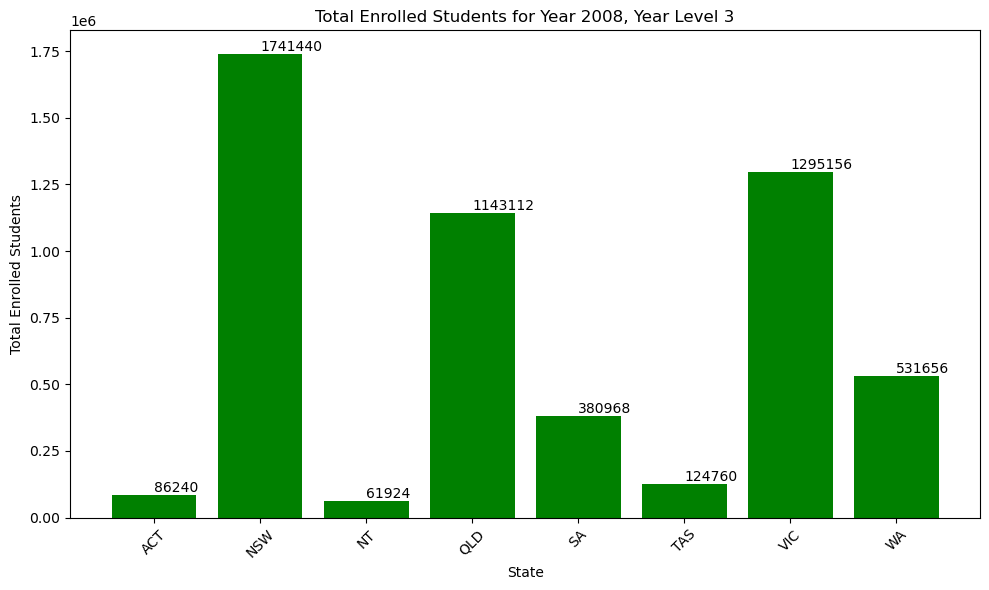

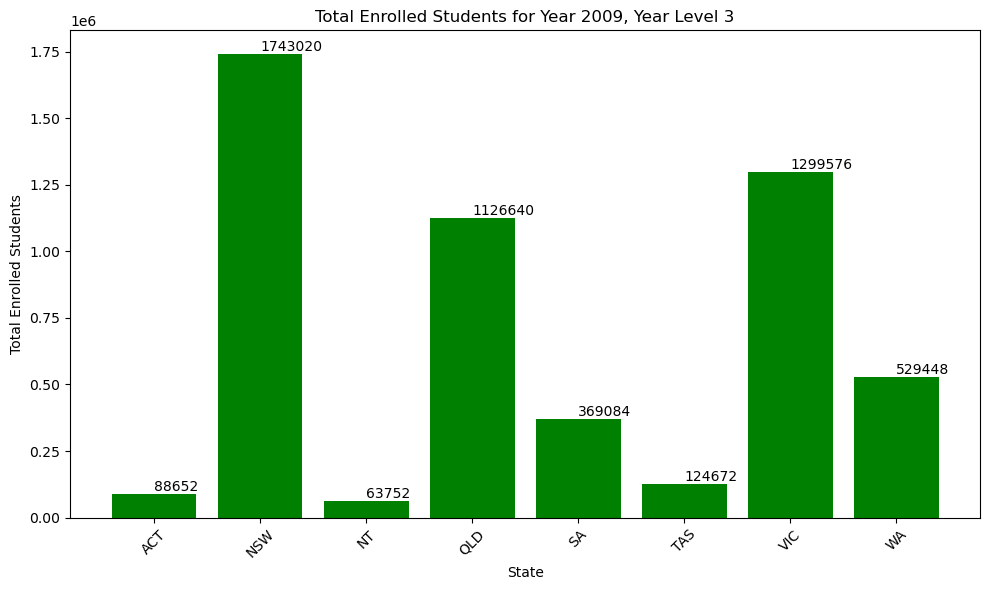

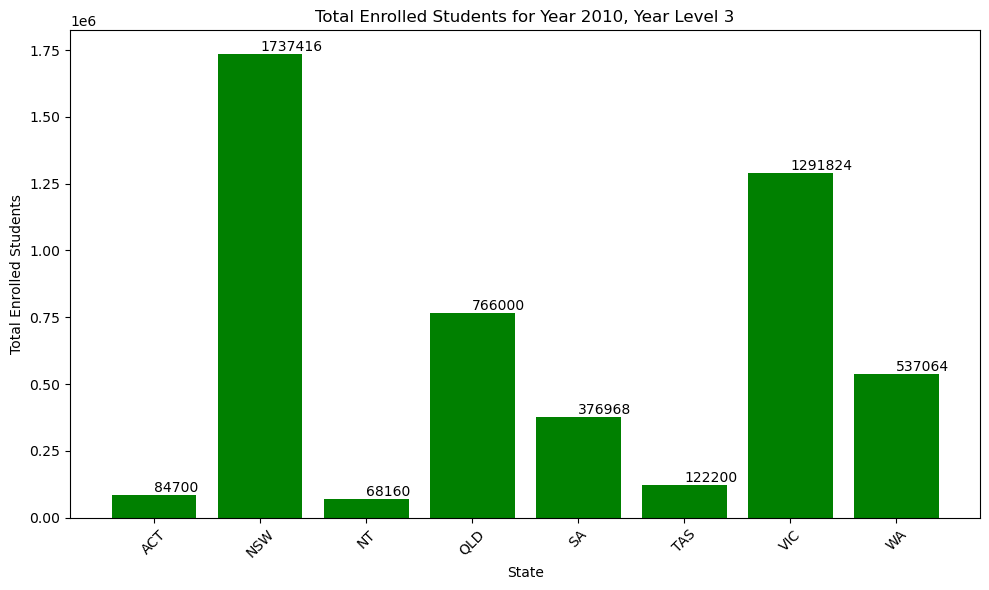

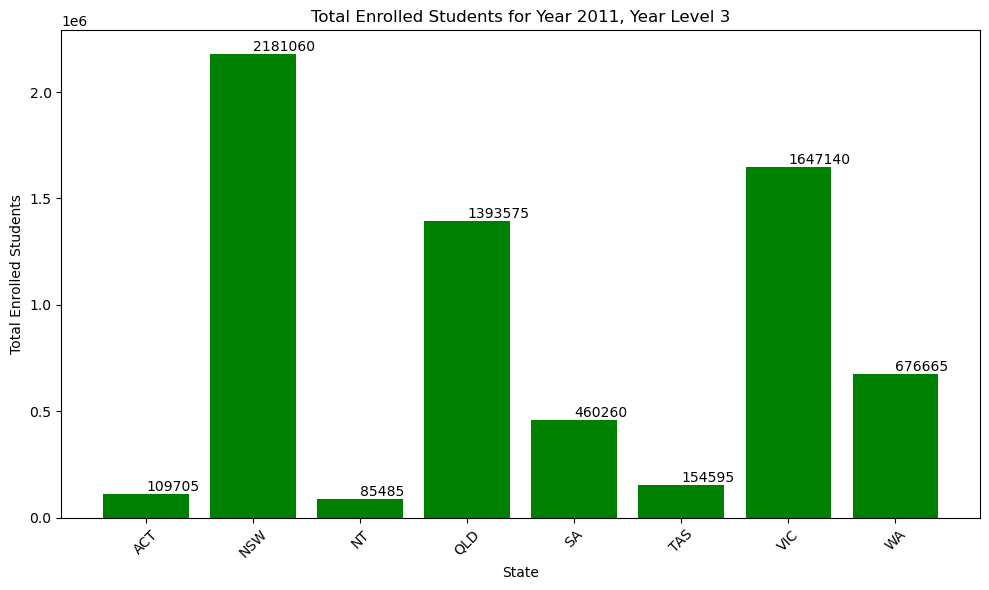

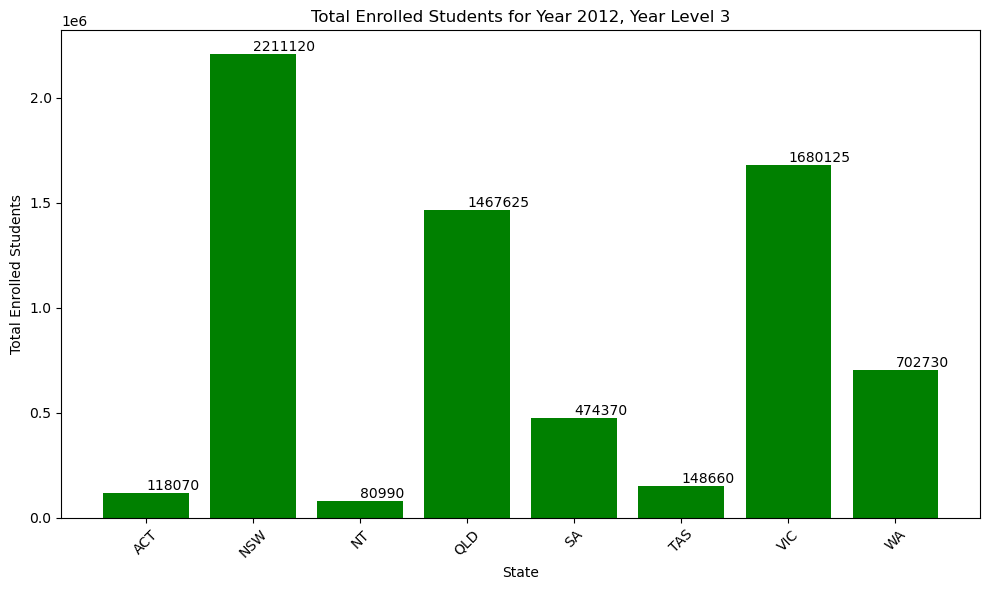

...

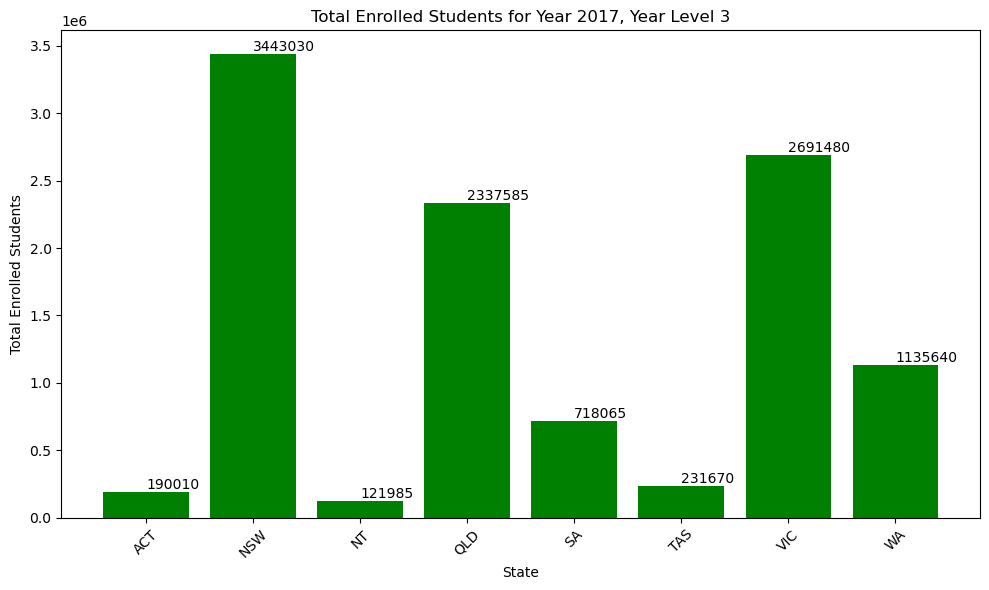

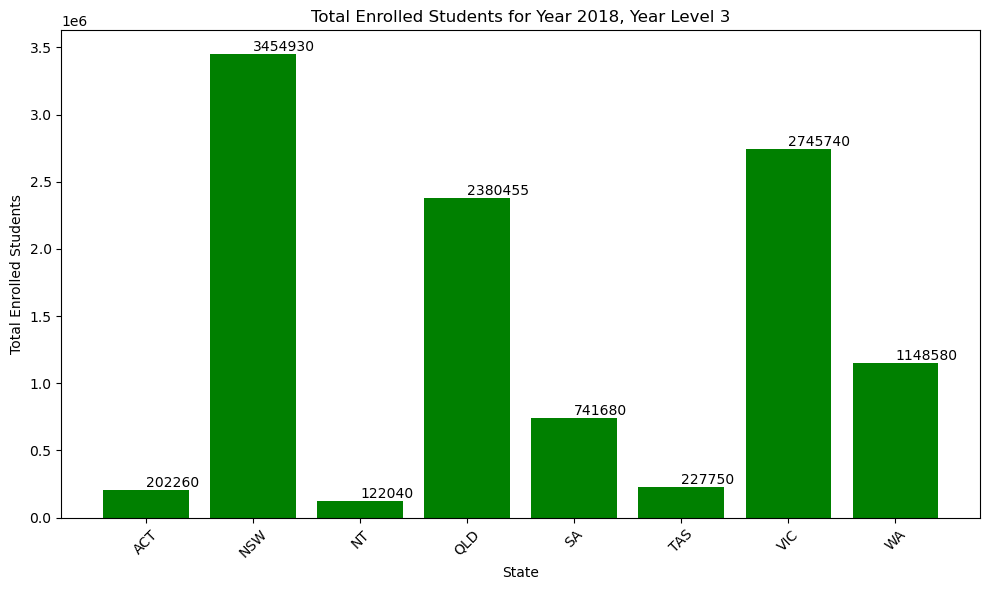

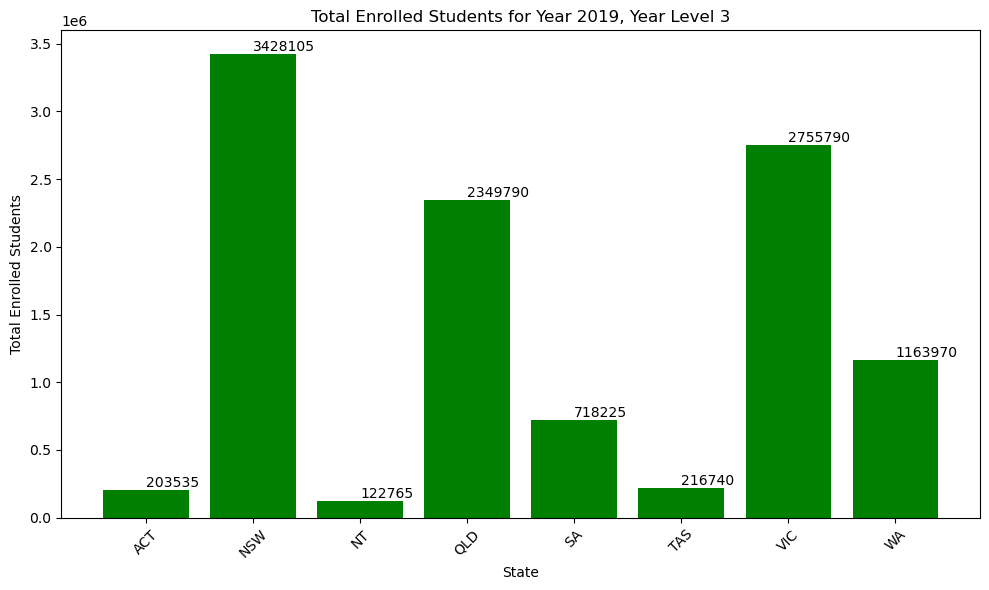

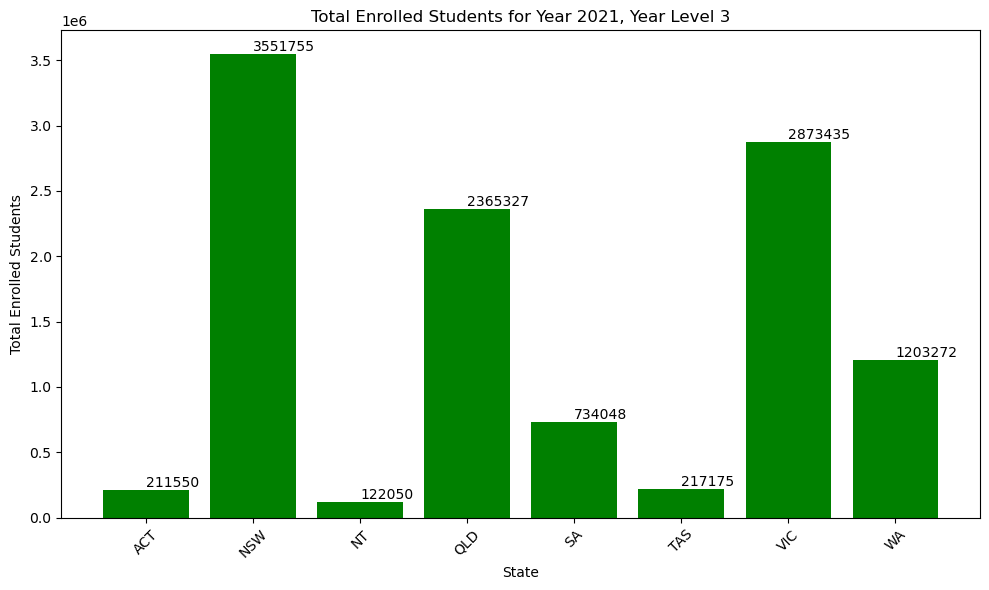

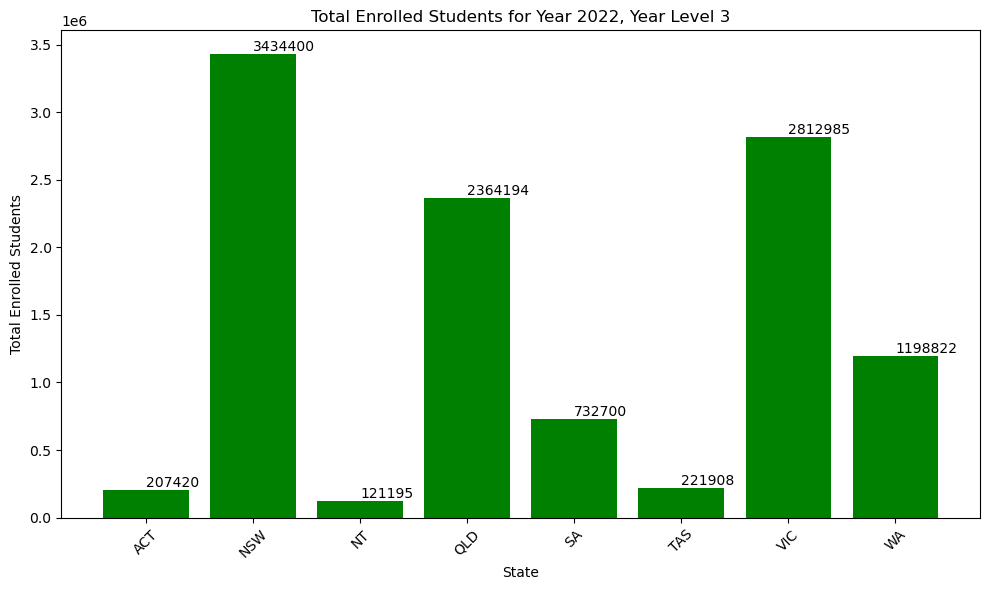

In [107]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you've fetched the data into the DataFrame 'data1'

# Filter data for Year Level 3
year_level_3_data = data1[data1['YEAR_LEVEL'] == 3]

# Group by Calendar Year and State to find total enrolled students for Year Level 3
enrolled_by_state = year_level_3_data.groupby(['CALENDAR_YEAR', 'STATE'])['ENROLLED_STUDENTS'].sum().reset_index()

# Get unique Calendar Years
unique_years = enrolled_by_state['CALENDAR_YEAR'].unique()

# Plot a separate bar chart for each Calendar Year, showing enrolled students per state for Year Level 3
for year in unique_years:
    year_state_data = enrolled_by_state[enrolled_by_state['CALENDAR_YEAR'] == year]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(year_state_data['STATE'], year_state_data['ENROLLED_STUDENTS'], color='green')
    
    # Annotate each bar with the total enrollment value
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval, int(yval), va='bottom')

    plt.title(f'Total Enrolled Students for Year {year}, Year Level 3')
    plt.xlabel('State')
    plt.ylabel('Total Enrolled Students')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


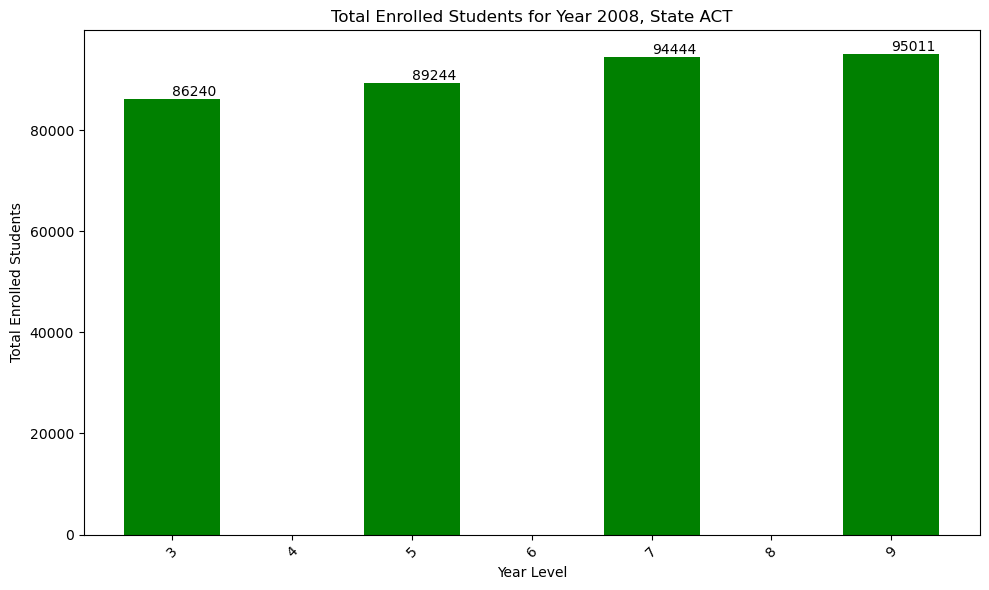

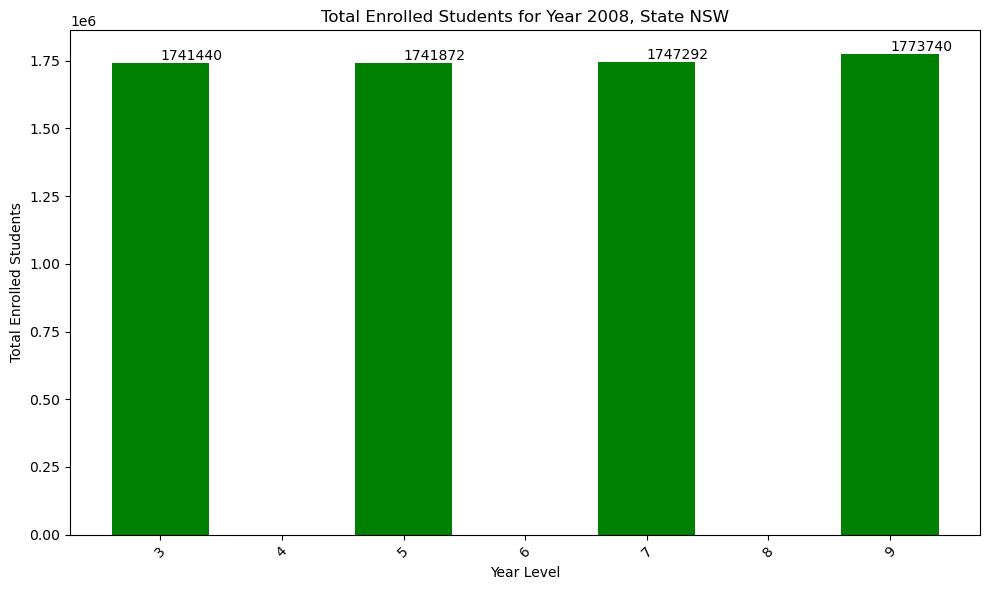

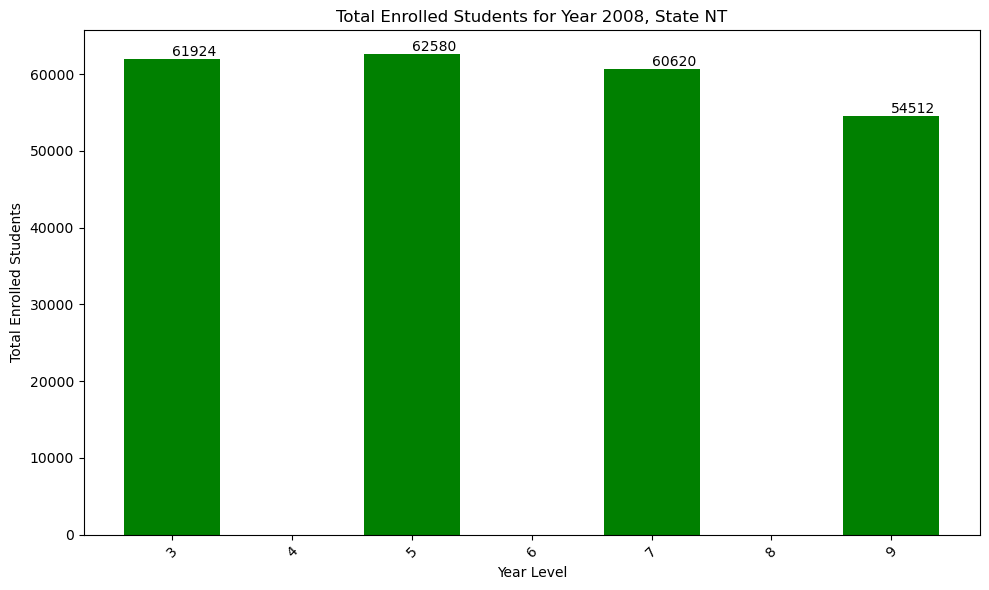

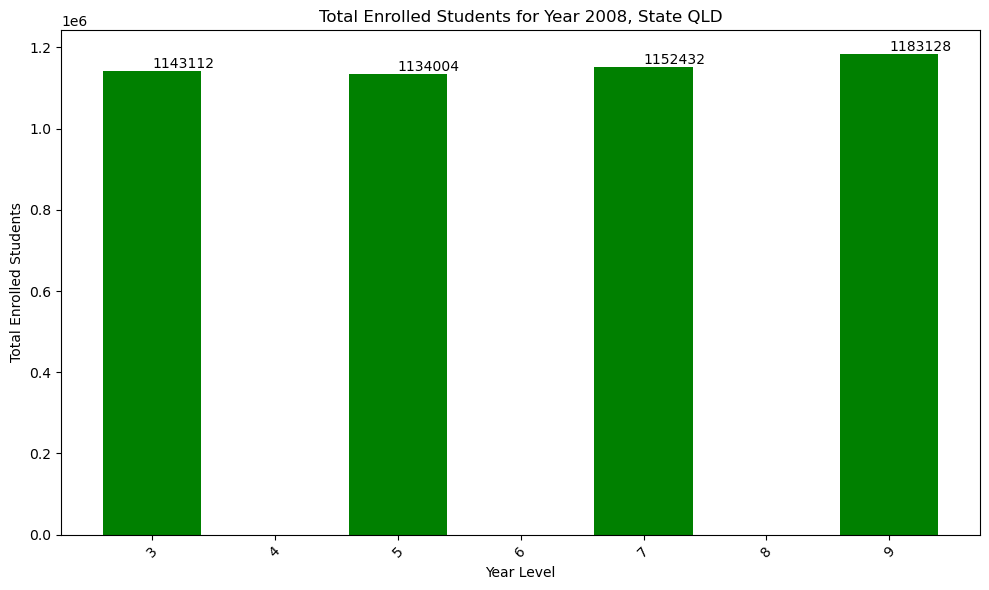

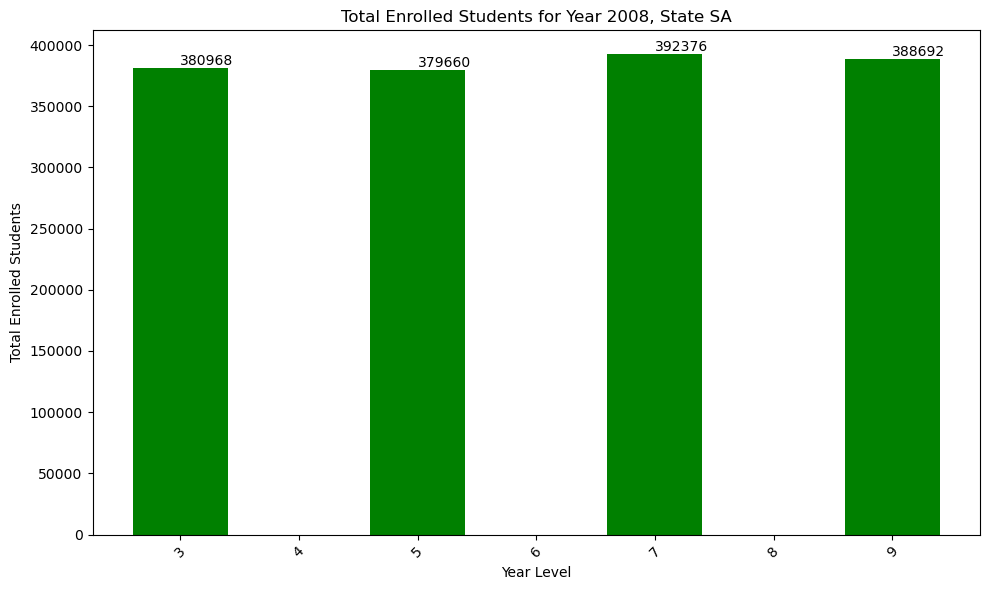

...

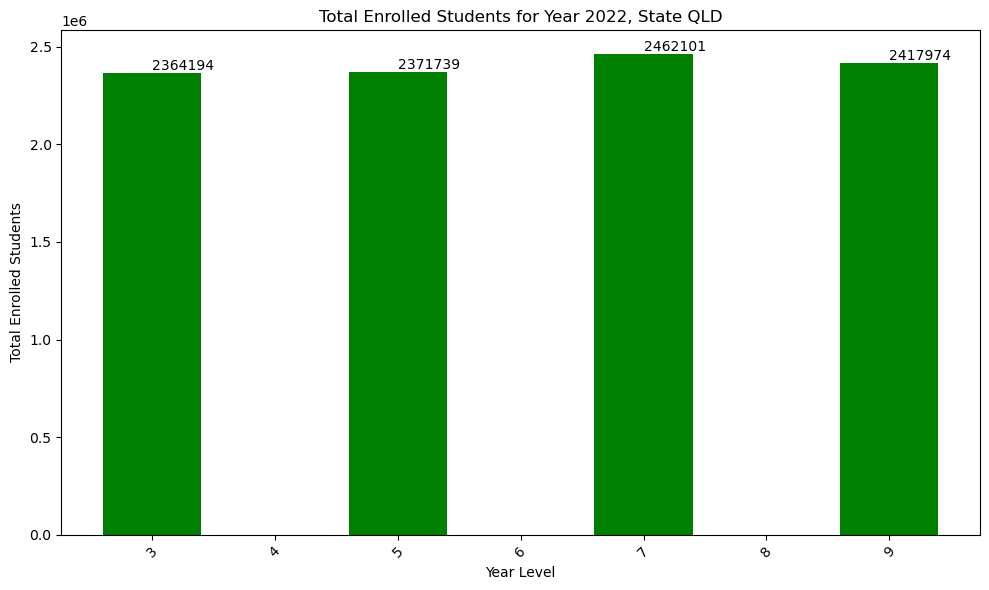

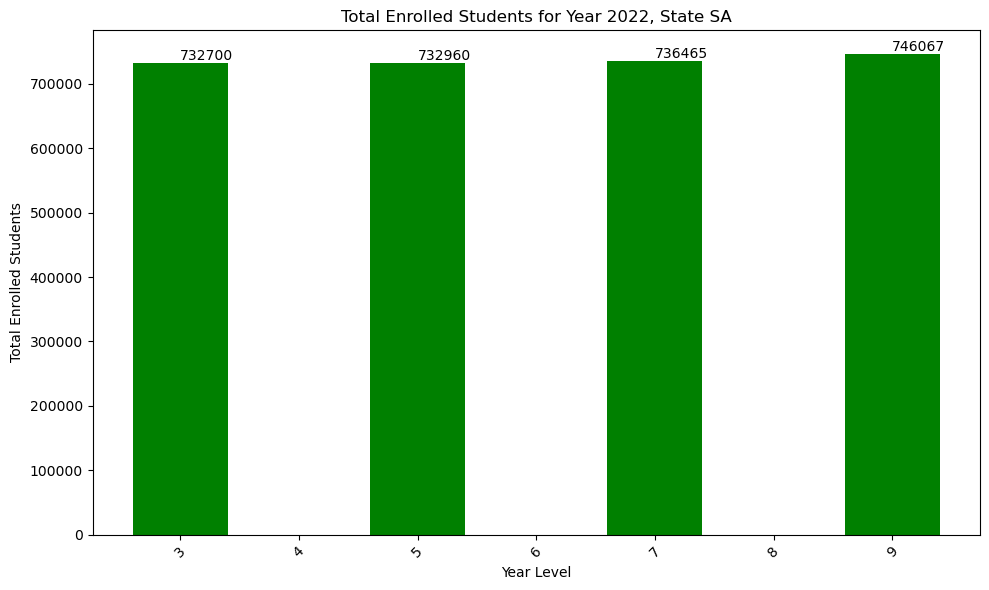

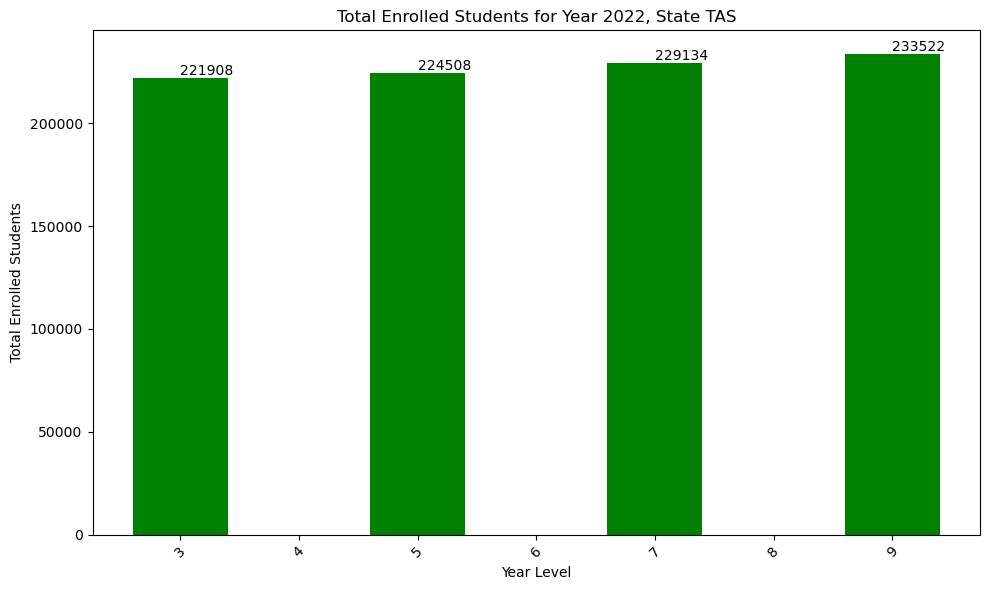

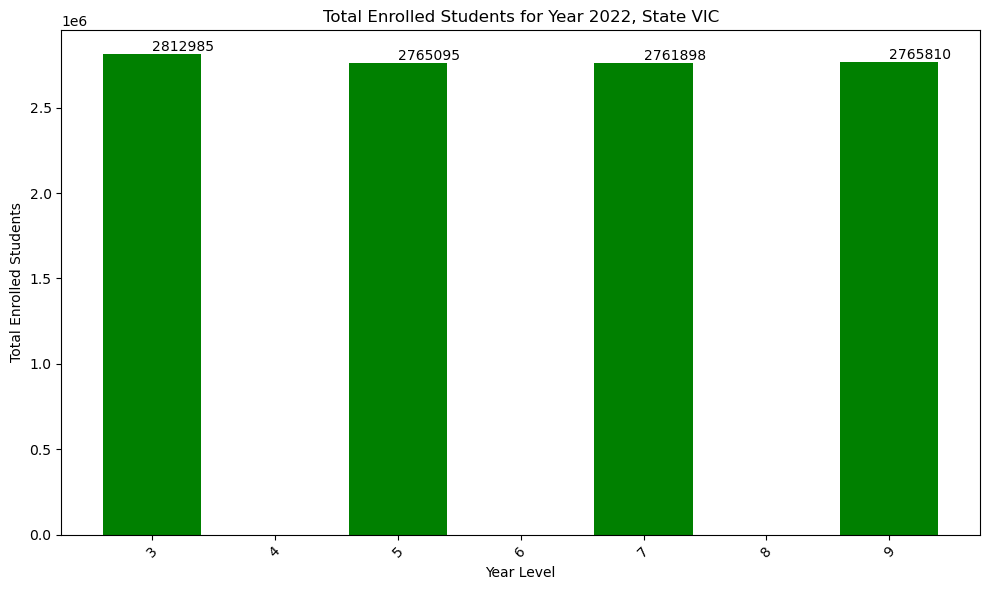

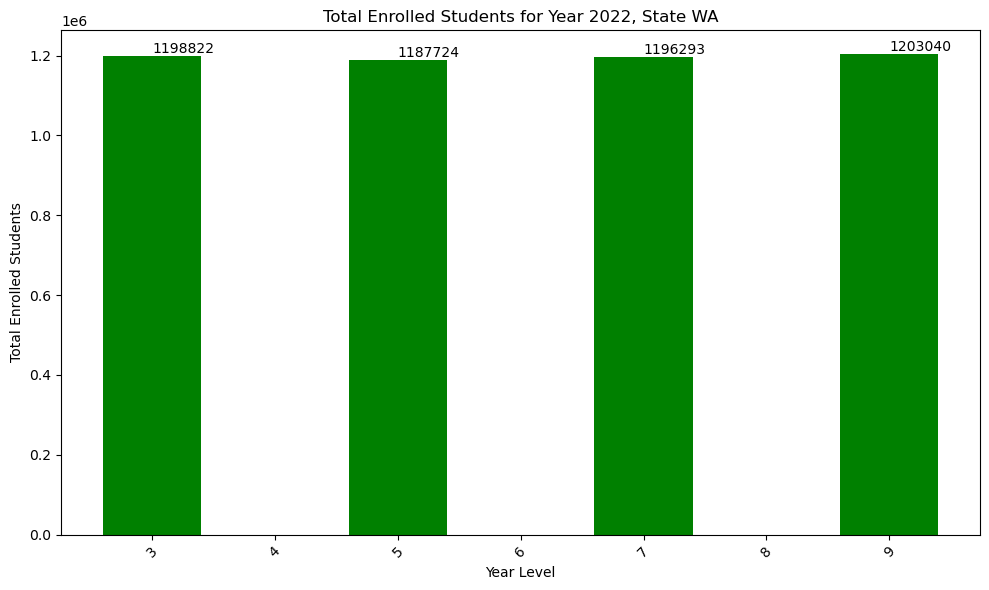

In [106]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you've fetched the data into the DataFrame 'data1'

# Group by Calendar Year, State, and Year Level to find total enrolled students
enrolled_by_state_year_level = data1.groupby(['CALENDAR_YEAR', 'STATE', 'YEAR_LEVEL'])['ENROLLED_STUDENTS'].sum().reset_index()

# Get unique combinations of Calendar Year, State, and Year Level
unique_years = enrolled_by_state_year_level['CALENDAR_YEAR'].unique()
unique_states = enrolled_by_state_year_level['STATE'].unique()

# Plot a separate bar chart for each Calendar Year, showing enrolled students per state per year level
for year in unique_years:
    for state in unique_states:
        year_state_data = enrolled_by_state_year_level[(enrolled_by_state_year_level['CALENDAR_YEAR'] == year) & (enrolled_by_state_year_level['STATE'] == state)]
        
        plt.figure(figsize=(10, 6))
        bars = plt.bar(year_state_data['YEAR_LEVEL'], year_state_data['ENROLLED_STUDENTS'], color='green')
        
        # Annotate each bar with the total enrollment value
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2.0, yval, int(yval), va='bottom')

        plt.title(f'Total Enrolled Students for Year {year}, State {state}')
        plt.xlabel('Year Level')
        plt.ylabel('Total Enrolled Students')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


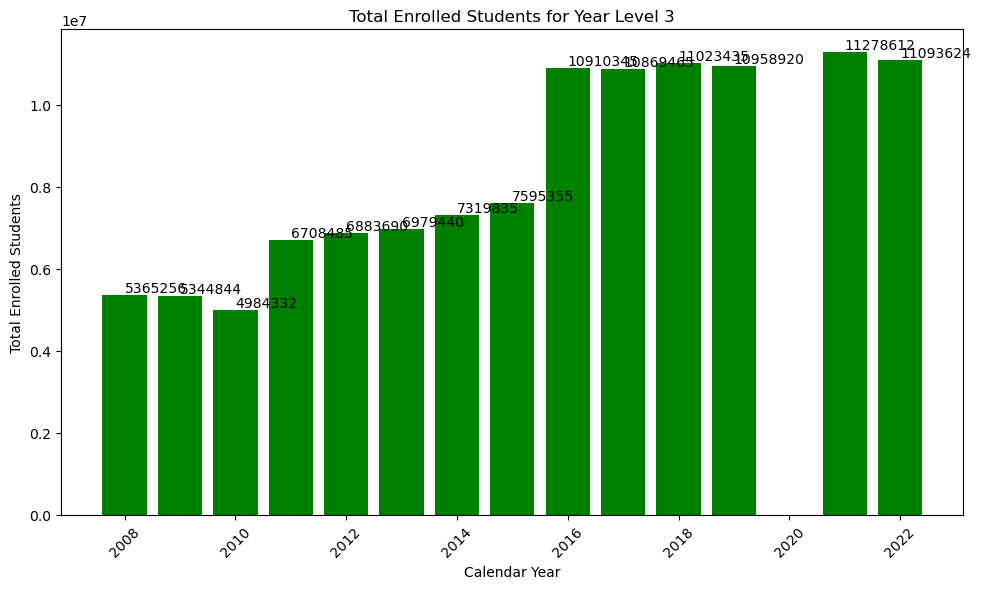

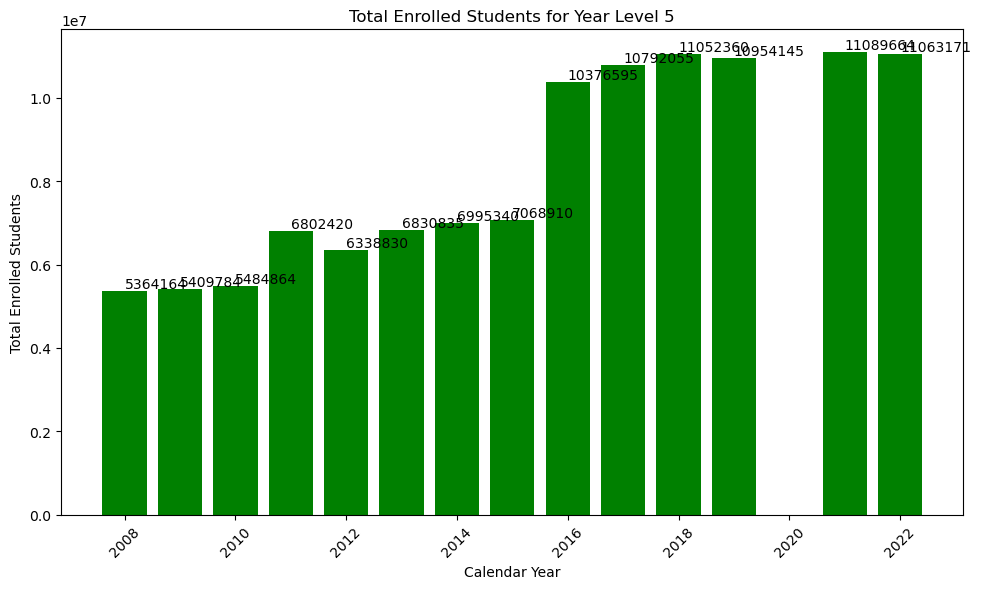

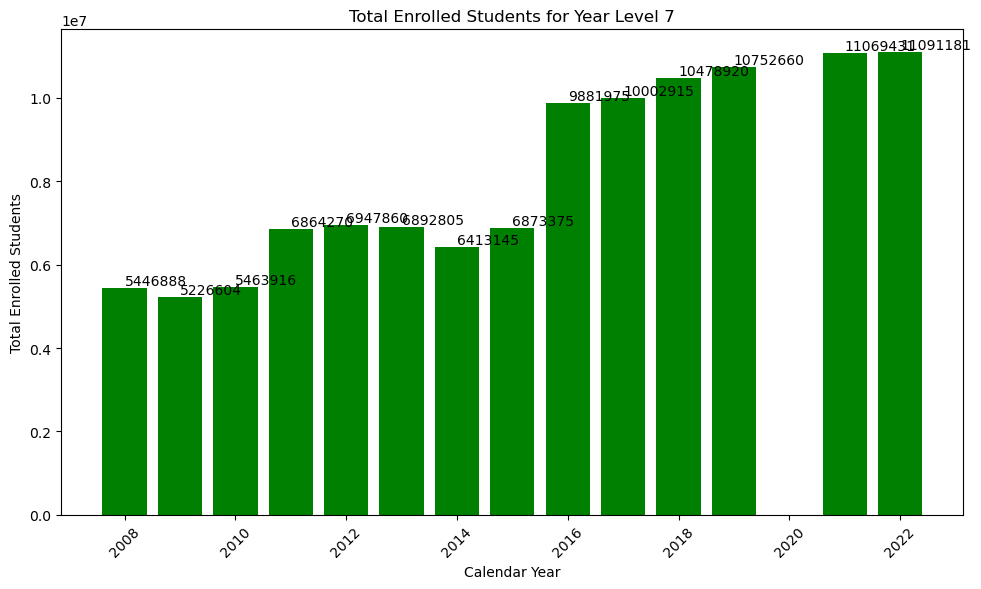

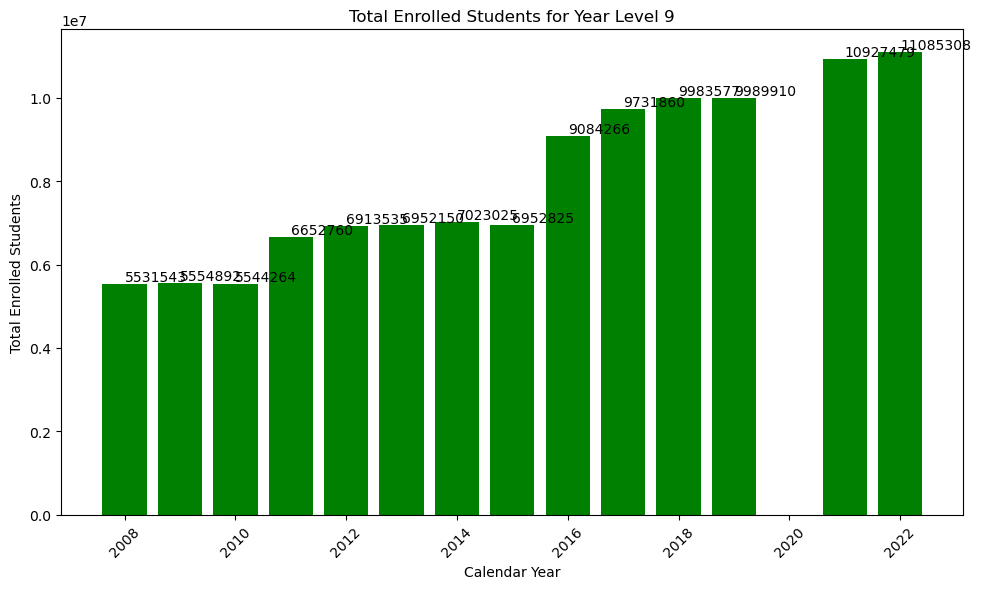

In [102]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you've fetched the data into the DataFrame 'data1'

# Group by Calendar Year and Year Level to find total enrolled students
enrolled_by_year_level = data1.groupby(['CALENDAR_YEAR', 'YEAR_LEVEL'])['ENROLLED_STUDENTS'].sum().reset_index()

# Get unique year levels
unique_year_levels = enrolled_by_year_level['YEAR_LEVEL'].unique()

# Plot a separate bar graph for each year level
for year_level in unique_year_levels:
    year_level_data = enrolled_by_year_level[enrolled_by_year_level['YEAR_LEVEL'] == year_level]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(year_level_data['CALENDAR_YEAR'], year_level_data['ENROLLED_STUDENTS'], color='green')
    
    # Annotate each bar with the total enrollment value
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval, int(yval), va='bottom')

    plt.title(f'Total Enrolled Students for Year Level {year_level}')
    plt.xlabel('Calendar Year')
    plt.ylabel('Total Enrolled Students')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [89]:
# student year grouped 'Domain' per year level
Group_Yr3 = data1.loc[data1['YEAR_LEVEL'] == 3].groupby(['ENROLLED_STUDENTS'])
# Group_Yr5 = data1.loc[data1['YEAR_LEVEL'] == 5].groupby(['DOMAIN', 'CALENDAR_YEAR'])
# Group_Yr7 = data1.loc[data1['YEAR_LEVEL'] == 7].groupby(['DOMAIN', 'CALENDAR_YEAR'])
# Group_Yr9 = data1.loc[data1['YEAR_LEVEL'] == 9].groupby(['DOMAIN', 'CALENDAR_YEAR'])
# Group_by_state = data1.loc[data1['YEAR_LEVEL'] == 3].groupby(['STATE'])
Group_Yr3.head()

,CALENDAR_YEAR,YEAR_LEVEL,DOMAIN,STATE,SUBGROUP,ENROLLED_STUDENTS,MEAN,MEAN_CI,MEAN_SD,NMS,...,BANDCOL5,BANDCOL6,PCTL05,PCTL20,PCTL80,PCTL95,NOD_MEAN_PREV,NOD_NMS_PREV,NOD_MEAN_BASE,NOD_NMS_BASE
0,2008,3,Grammar and Punctuation,ACT,Parental Education: Bachelor,167,445.2,NaN,79.7,95.8,...,23.4,37.0,308.7,381.3,513.0,565.4,None,None,None,None
1,2008,3,Grammar and Punctuation,ACT,Parental Education: Certificate,72,396.1,NaN,91.0,90.0,...,15.3,20.3,240.9,319.4,476.6,546.1,None,None,None,None
2,2008,3,Grammar and Punctuation,ACT,Parental Education: Diploma,52,401.4,NaN,69.1,96.9,...,24.2,12.3,283.7,342.1,456.3,519.2,None,None,None,None
3,2008,3,Grammar and Punctuation,ACT,Parental Education: Not stated,4009,419.8,NaN,82.7,93.7,...,23.5,23.9,278.0,351.0,489.8,551.1,None,None,None,None
4,2008,3,Grammar and Punctuation,ACT,Non-LBOTE,3852,421.2,6.2,82.5,94.4,...,23.7,24.6,279.6,352.5,491.1,552.4,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45723,2022,3,Writing,WA,Parental Occupation: Not stated,4132,394.3,5.5,76.0,90.9,...,23.7,11.5,256.6,332.6,456.9,504.0,Close to,Close to,Close to,Close to
45724,2022,3,Writing,WA,Outer regional,2467,399.7,5.9,66.7,95.1,...,25.7,10.0,278.1,348.9,454.5,497.7,Close to,Close to,Close to,Close to
45725,2022,3,Writing,WA,Remote,1364,393.2,9.2,69.7,93.5,...,23.9,9.1,266.0,339.9,449.2,495.2,Close to,Close to,Close to,Close to
45727,2022,3,Writing,WA,Parental Education: Year 11,2499,371.4,4.5,73.9,88.5,...,17.6,5.3,241.6,305.0,433.6,480.2,Close to,Close to,Close to,Close to


In [64]:
print(Group_Yr3.groups.keys())
print(Group_Yr5.groups.keys())
print(Group_Yr7.groups.keys())
print(Group_Yr9.groups.keys())

dict_keys([('Grammar and Punctuation', 2008), ('Grammar and Punctuation', 2009), ('Grammar and Punctuation', 2010), ('Grammar and Punctuation', 2011), ('Grammar and Punctuation', 2012), ('Grammar and Punctuation', 2013), ('Grammar and Punctuation', 2014), ('Grammar and Punctuation', 2015), ('Grammar and Punctuation', 2016), ('Grammar and Punctuation', 2017), ('Grammar and Punctuation', 2018), ('Grammar and Punctuation', 2019), ('Grammar and Punctuation', 2021), ('Grammar and Punctuation', 2022), ('Numeracy', 2008), ('Numeracy', 2009), ('Numeracy', 2010), ('Numeracy', 2011), ('Numeracy', 2012), ('Numeracy', 2013), ('Numeracy', 2014), ('Numeracy', 2015), ('Numeracy', 2016), ('Numeracy', 2017), ('Numeracy', 2018), ('Numeracy', 2019), ('Numeracy', 2021), ('Numeracy', 2022), ('Reading', 2008), ('Reading', 2009), ('Reading', 2010), ('Reading', 2011), ('Reading', 2012), ('Reading', 2013), ('Reading', 2014), ('Reading', 2015), ('Reading', 2016), ('Reading', 2017), ('Reading', 2018), ('Reading'

In [67]:
# Sample data
data = {'Year': [2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022],
        'DOMAIN': ['Grammar and Punctuation', 'Numeracy', 'Reading', 'Spelling', 'Writing']}

# Create a DataFrame
Group_Yr3 = pd.DataFrame(data)

# Group by year and count enrolled students
enrolled3 = Group_Yr3.groupby('Year')['DOMAIN'].sum()

# Plotting the graph
plt.figure(figsize=(10, 6))
enrolled3.plot(kind='bar', color='blue')
plt.title('Number of Enrolled Students by Year')
plt.xlabel('Year')
plt.ylabel('Number of Enrolled Students')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


ValueError: All arrays must be of the same length

In [62]:
Group_Yr3['ENROLLED_STUDENTS'].count()

DOMAIN                   CALENDAR_YEAR
Grammar and Punctuation  2008             141
                         2009             143
                         2010             144
                         2011             144
                         2012             144
                                         ... 
Writing                  2017             235
                         2018             235
                         2019             235
                         2021             236
                         2022             232
Name: ENROLLED_STUDENTS, Length: 67, dtype: int64

In [38]:
enrolled5 = pd.DataFrame(Group_Yr5['ENROLLED_STUDENTS'].count())
enrolled5

ENROLLED_STUDENTS
DOMAIN                  CALENDAR_YEAR                   
Grammar and Punctuation 2008                         142
                        2009                         143
                        2010                         144
                        2011                         144
                        2012                         144
...                                                  ...
Writing                 2017                         235
                        2018                         234
                        2019                         235
                        2021                         235
                        2022                         231

[67 rows x 1 columns]

In [6]:
# Import required libraries and dependencies
import pandas as pd
import hvplot.pandas
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import RandomForestClassifier
import numpy as np

In [7]:
# Use the `StandardScaler()` module from scikit-learn to normalize the data from the CSV file
scaled = StandardScaler().fit_transform(data1[['PARTICIPATION_RATE', 'PARTICIPATION_NUMBER']])
scaled[0:5]

array([[ 0.75670637, -0.60993165],
       [ 0.42532212, -0.61659443],
       [ 0.65474198, -0.61787028],
       [ 0.59101424, -0.34951614],
       [ 0.59101424, -0.36007735]])

In [8]:
# Create a DataFrame with the scaled data
scaled_df = pd.DataFrame(
    scaled,
    columns=['PARTICIPATION_RATE', 'PARTICIPATION_NUMBER'],
    )
# Copy the crypto names from the original data
scaled_df['NMS'] = data1.index

# Set the coinid column as index
scaled_df.set_index('NMS', inplace=True)

# Display sample data
scaled_df.head(5)

,PARTICIPATION_RATE,PARTICIPATION_NUMBER
NMS,,
0,0.756706,-0.609932
1,0.425322,-0.616594
2,0.654742,-0.617870
3,0.591014,-0.349516
4,0.591014,-0.360077


In [9]:
# Create a list with the number of k-values from 1 to 11
k = list(range(1, 11))
# Create an empty list to store the inertia values
inertia = []

In [10]:
# Create a for loop to compute the inertia with each possible value of k
# Inside the loop:
# 1. Create a KMeans model using the loop counter for the n_clusters
# 2. Fit the model to the data using `df_Naplan`
# 3. Append the model.inertia_ to the inertia list
for i in k:
    k_model = KMeans(n_clusters=i, random_state=1, n_init='auto')
    k_model.fit(scaled_df)
    inertia.append(k_model.inertia_)

In [11]:
# Create a dictionary with the data to plot the Elbow curve
elbow_data = {"k": k, "inertia": inertia}

In [12]:
# Create a DataFrame with the data to plot the Elbow curve
df_elbow = pd.DataFrame(elbow_data)
df_elbow.head()

,k,inertia
0,1,98350.000000
1,2,61158.605473
2,3,30146.692041
3,4,22555.675372
4,5,14839.461885


In [13]:
# Plot a line chart with all the inertia values computed with 
# the different values of k to visually identify the optimal value for k.
df_elbow.hvplot.line(
    x="k", 
    y="inertia", 
    title="Elbow Curve", 
    xticks=k
)

:Curve   [k]   (inertia)

In [14]:
# Initialise the K-Means model using the best value for k
model = KMeans(n_clusters=3, random_state=1, n_init='auto')

In [15]:
# Fit the K-Means model using the scaled data
model.fit(scaled_df)

KMeans(n_clusters=3, n_init='auto', random_state=1)

In [16]:
# Predict the clusters to group the cryptocurrencies using the scaled data
k_cluster = model.predict(scaled_df)

# Print the resulting array of cluster values.
k_cluster

array([0, 0, 0, ..., 2, 2, 0])

In [17]:
# Create a copy of the DataFrame
copy_predictions = scaled_df.copy()

# Add a new column to the DataFrame with the predicted clusters

copy_predictions['Predicted Clusters'] = k_cluster

In [18]:
# Display sample data
copy_predictions.head(5)

,PARTICIPATION_RATE,PARTICIPATION_NUMBER,Predicted Clusters
NMS,,,
0,0.756706,-0.609932,0
1,0.425322,-0.616594,0
2,0.654742,-0.617870,0
3,0.591014,-0.349516,0
4,0.591014,-0.360077,0


In [19]:
copy_predictions.hvplot.scatter(
    x="PARTICIPATION_RATE",
    y="PARTICIPATION_NUMBER",
    by="Predicted Clusters",
    color=["red", "blue", "green"],
).opts(yformatter="%.0f")

c:\Users\killb\anaconda3\lib\site-packages\holoviews\core\data\pandas.py:221: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  data = [(k, group_type(v, **group_kwargs)) for k, v in


:NdOverlay   [Predicted Clusters]
   :Scatter   [PARTICIPATION_RATE]   (PARTICIPATION_NUMBER)

In [20]:
# Perform one-hot encoding
df_encoded = pd.get_dummies(data1)
cols= df_encoded.columns
cols

Index(['CALENDAR_YEAR', 'YEAR_LEVEL', 'ENROLLED_STUDENTS', 'MEAN', 'MEAN_CI',
       'MEAN_SD', 'NMS', 'NMS_CI', 'GAIN', 'GAIN_CI',
       ...
       'NOD_MEAN_BASE_Above', 'NOD_MEAN_BASE_Below', 'NOD_MEAN_BASE_Close to',
       'NOD_MEAN_BASE_Significantly above',
       'NOD_MEAN_BASE_Significantly below', 'NOD_NMS_BASE_Above',
       'NOD_NMS_BASE_Below', 'NOD_NMS_BASE_Close to',
       'NOD_NMS_BASE_Significantly above', 'NOD_NMS_BASE_Significantly below'],
      dtype='object', length=156)